# Go2 Joystick Policy with APG Training Notebook

In [1]:
%load_ext autoreload
%autoreload 2

## Initialization

In [2]:
import os

xla_flags = os.environ.get("XLA_FLAGS", "")
xla_flags += " --xla_gpu_triton_gemm_any=True"
os.environ["XLA_FLAGS"] = xla_flags
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
# os.environ["MUJOCO_EGL_DEVICE_ID"] = "2"
os.environ["MUJOCO_GL"] = "egl"
# os.environ['MUJOCO_GL'] = 'osmesa'
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
os.environ['JAX_LOG_COMPILES'] = '0'

In [3]:
import functools
import json
from datetime import datetime

# --- JAX Configuration (MUST be done before other JAX imports) ---
import jax
from jax import config

# Use 64-bit precision (Must be set before backend initialization)
config.update("jax_enable_x64", True)
config.update("jax_default_matmul_precision", "high")

# Other JAX configs
config.update("jax_debug_nans", False)

# Compilation cache configuration
cache_path = "/data/jit_cache"
if not os.path.exists(cache_path):
    os.makedirs(cache_path)
    print(f"Created JAX compilation cache directory at {cache_path}")

config.update("jax_compilation_cache_dir", cache_path)
config.update("jax_persistent_cache_min_entry_size_bytes", -1)
config.update("jax_persistent_cache_min_compile_time_secs", 1)
# -----------------------------------------------------------------

# Now import libraries that depend on JAX
import jax.numpy as jp
import matplotlib.pyplot as plt
import mediapy as media
import mujoco
import numpy as np
import wandb

from brax.training.agents.ppo import networks as ppo_networks
from brax.training.agents.ppo import train as ppo
from apg_alg.algorithm import apg
from apg_alg.networks import apg_networks

from etils import epath
from flax.training import orbax_utils
from IPython.display import clear_output, display
from orbax import checkpoint as ocp

from mujoco_playground import locomotion, wrapper
from mujoco_playground.config import locomotion_params

print("JAX configured. x64 enabled:", config.read("jax_enable_x64"))

Warp DeprecationWarning: The namespace `warp.context` will soon be removed from the public API. It can still be accessed from `warp._src.context` but might be changed or removed without notice.
Warp DeprecationWarning: The symbol `warp.context.Module` will soon be removed from the public API. Use `warp.Module` instead.
Warp DeprecationWarning: The symbol `warp.context.get_module` will soon be removed from the public API. Use `warp.get_module` instead.
Warp DeprecationWarning: The namespace `warp.math` will soon be removed from the public API. It can still be accessed from `warp._src.math` but might be changed or removed without notice.
JAX configured. x64 enabled: True


In [4]:
env_name = "Go2Joystick2"
env_cfg = locomotion.get_default_config(env_name)
eval_env_cfg = locomotion.get_default_config(env_name)
randomizer = locomotion.get_domain_randomizer(env_name)
apg_params = locomotion_params.brax_apg_config(env_name)

## Testing anchor policy

In [5]:
# def play_anchor_only(
#     env,
#     reset_fn,
#     step_fn,
#     n_step: int = 500,
#     render_every: int = 2,
#     save_path: str = None,
#     seed: int = 42
# ):
#     """
#     运行并渲染仅由 Anchor Policy 驱动的轨迹。
#     通过传入全 0 的 Residual Action 实现。
#     """
#     batch_size = 1 
#     rng = jax.random.PRNGKey(seed)
#     rngs = jax.random.split(rng, batch_size)
    
#     state = reset_fn(rngs)
#     trajectory_qpos = [state.data.qpos[0]]
    
#     print(f"Starting Anchor Policy rollout for {n_step} steps...")

#     # 2. Simulation Loop
#     for i in range(n_step):
#         action = jp.zeros((batch_size, env.action_size))
#         state = step_fn(state, action)

#         if state.done[0] > 0.5: 
#             print(f"Early termination at step {i+1} (Robot fell)")
#             break
            
#         trajectory_qpos.append(state.data.qpos[0])

#     trajectory_stack = jp.stack(trajectory_qpos)
    
#     print("Rendering video...")
#     frames = env._render_trajectory(
#         trajectory=trajectory_stack,
#         render_every=render_every,
#         height=480, 
#         width=640,
#         save_path=save_path
#     )

#     # 5. Display in Notebook
#     fps = 1.0 / (env.dt * render_every)
#     print(f"Video saved to {save_path}, FPS: {fps}")
#     media.show_video(frames, fps=fps, loop=True)

#     return state

In [6]:
# demo_cfg = locomotion.get_default_config(env_name)
# demo_cfg["disturbance"]["enable"] = True

# demo_cfg["assistive_wrench"]["enable"] = True
# demo_cfg["assistive_wrench"]["enable_feedforward"] = True
# demo_cfg["assistive_wrench"]["ff_mass_mode"] = "subtree"
# demo_cfg["assistive_wrench"]["force_limit"] = 200.0
# demo_cfg["assistive_wrench"]["torque_limit"] = 50.0

# demo_cfg["assistive_wrench"]["gains"]["xy_d"] = 100.0
# demo_cfg["assistive_wrench"]["gains"]["z_p"] = 500.0
# demo_cfg["assistive_wrench"]["gains"]["z_d"] = 50.0
# demo_cfg["assistive_wrench"]["gains"]["roll_p"] = 50.0
# demo_cfg["assistive_wrench"]["gains"]["roll_d"] = 5.0
# demo_cfg["assistive_wrench"]["gains"]["pitch_p"] = 50.0
# demo_cfg["assistive_wrench"]["gains"]["pitch_d"] = 5.0
# demo_cfg["assistive_wrench"]["gains"]["yaw_d"] = 50.0

# demo_cfg["assistive_wrench"]["beta"]["initial"] = 1.0
# demo_cfg["assistive_wrench"]["beta"]["final"] = 0.0
# demo_cfg["assistive_wrench"]["curriculum"]["mode"] = "staircase"
# demo_cfg["assistive_wrench"]["curriculum"]["staircase_levels"] = 10
# demo_cfg["assistive_wrench"]["curriculum"]["start_step"] = 0
# demo_cfg["assistive_wrench"]["curriculum"]["end_step"] = 400

# demo_env = locomotion.load(env_name, demo_cfg)
# demo_step_fn = jax.jit(demo_env.step)
# demo_reset_fn = jax.jit(demo_env.reset)


In [7]:
# state_final = play_anchor_only(demo_env, demo_reset_fn, demo_step_fn)

In [8]:
# demo_env.check_phase_alignment()

In [9]:
# demo_env.play_cycloid_foot_trajectory(
#     command=[0.4, 0.2, 0.0],  # 固定 command
#     foot="FL_foot",
#     render_every=2,
# )


In [10]:
# fixed_cmd = jp.array([0.4, 0.1, 0.3])
# states = []
# state = demo_env.reset(jax.random.PRNGKey(0))
# state.info["steps_until_next_cmd"] = jp.array(10**9, dtype=jp.int32)
# for _ in range(450):
#     state.info["command"] = fixed_cmd
#     action = jp.zeros(demo_env.action_size)
#     state = demo_step_fn(state, action)
#     states.append(state)

# scene_option = mujoco.MjvOption()
# scene_option.flags[mujoco.mjtVisFlag.mjVIS_TRANSPARENT] = True

# frames = demo_env.visualize_assistive_wrench(
#     trajectory=states,
#     render_every=2,
#     camera="track",
#     save_path="./assistive_wrench.mp4",
#     scene_option=scene_option,
# )



In [11]:
# fixed_cmd = jp.array([0.4, 0.0, 0.0])
# num_steps = 220

# lift_action = jp.zeros(demo_env.action_size)

# # Apply the same lift posture to all four legs.
# for leg_start in [0,]:
#     lift_action = lift_action.at[leg_start + 1].set(+0.4)  # thigh
#     lift_action = lift_action.at[leg_start + 2].set(-1.2)   # calf

# state = demo_env.reset(jax.random.PRNGKey(1))
# state.info["steps_until_next_cmd"] = jp.array(10**9, dtype=jp.int32)
# states_lift = []

# for _ in range(num_steps):
#     state.info["command"] = fixed_cmd
#     state = demo_step_fn(state, lift_action)
#     states_lift.append(state)

# scene_option = mujoco.MjvOption()
# scene_option.flags[mujoco.mjtVisFlag.mjVIS_TRANSPARENT] = True

# frames_lift = demo_env.visualize_assistive_wrench(
#     trajectory=states_lift,
#     render_every=2,
#     camera="track",
#     save_path="./assistive_wrench_lift_all_legs.mp4",
#     scene_option=scene_option,
# )



In [12]:
# import numpy as np
# import matplotlib.pyplot as plt

# fixed_cmd = jp.array([0.4, 0.1, 0.3])
# num_steps = 340
# hard_disable_step = int(demo_cfg["assistive_wrench"]["curriculum"]["end_step"])
# hard_disable_time = hard_disable_step * demo_env.dt
# staircase_levels = int(demo_cfg["assistive_wrench"]["curriculum"].get("staircase_levels", 10))
# staircase_times = np.linspace(0.0, hard_disable_time, staircase_levels + 1)

# state = demo_env.reset(jax.random.PRNGKey(0))
# state.info["steps_until_next_cmd"] = jp.array(10**9, dtype=jp.int32)

# hist = {
#     "vx_cmd": [],
#     "vy_cmd": [],
#     "wz_cmd": [],
#     "vx": [],
#     "vy": [],
#     "z": [],
#     "z_ref": [],
#     "roll": [],
#     "pitch": [],
#     "wz": [],
#     "beta": [],
#     "force_norm": [],
#     "torque_norm": [],
#     "assist_force_x": [],
#     "assist_force_y": [],
#     "assist_force_z": [],
#     "dist_force_x": [],
#     "dist_force_y": [],
#     "dist_force_z": [],
# }

# states = []
# for _ in range(num_steps):
#     state.info["command"] = fixed_cmd

#     cmd = np.array(state.info["command"])
#     local_vel = np.array(demo_env.get_local_linvel(state.data))
#     gyro = np.array(demo_env.get_gyro(state.data))
#     gravity_body = np.array(demo_env.get_gravity(state.data))
#     assist_force = np.array(state.info["assist_force_world"])
#     dist_force = np.array(state.data.xfrc_applied[demo_env.base_id, :3]) - assist_force

#     roll = np.arctan2(gravity_body[1], -gravity_body[2])
#     pitch = np.arctan2(
#         -gravity_body[0],
#         np.sqrt(gravity_body[1] ** 2 + gravity_body[2] ** 2) + 1e-6,
#     )

#     hist["vx_cmd"].append(cmd[0])
#     hist["vy_cmd"].append(cmd[1])
#     hist["wz_cmd"].append(cmd[2])
#     hist["vx"].append(local_vel[0])
#     hist["vy"].append(local_vel[1])
#     hist["z"].append(float(state.data.qpos[2]))
#     hist["z_ref"].append(float(demo_cfg["assistive_wrench"]["z_ref"]))
#     hist["roll"].append(float(roll))
#     hist["pitch"].append(float(pitch))
#     hist["wz"].append(float(gyro[2]))
#     hist["beta"].append(float(state.info["assist_beta"]))
#     hist["force_norm"].append(float(state.info["assist_force_norm"]))
#     hist["torque_norm"].append(float(state.info["assist_torque_norm"]))
#     hist["assist_force_x"].append(float(assist_force[0]))
#     hist["assist_force_y"].append(float(assist_force[1]))
#     hist["assist_force_z"].append(float(assist_force[2]))
#     hist["dist_force_x"].append(float(dist_force[0]))
#     hist["dist_force_y"].append(float(dist_force[1]))
#     hist["dist_force_z"].append(float(dist_force[2]))

#     action = jp.zeros(demo_env.action_size)
#     state = demo_step_fn(state, action)
#     states.append(state)

# t = np.arange(num_steps) * demo_env.dt

# fig, axes = plt.subplots(7, 1, figsize=(12, 19), sharex=True)

# axes[0].plot(t, hist["vx_cmd"], label="vx_cmd", linestyle="--")
# axes[0].plot(t, hist["vx"], label="vx_meas")
# axes[0].plot(t, hist["vy_cmd"], label="vy_cmd", linestyle="--")
# axes[0].plot(t, hist["vy"], label="vy_meas")
# axes[0].set_ylabel("Linear Vel")
# axes[0].legend()
# axes[0].grid(True)

# axes[1].plot(t, hist["z_ref"], label="z_ref", linestyle="--")
# axes[1].plot(t, hist["z"], label="z")
# axes[1].set_ylabel("Base Height")
# axes[1].legend()
# axes[1].grid(True)

# axes[2].plot(t, hist["roll"], label="roll")
# axes[2].axhline(0.0, color="r", linestyle="--", label="target")
# axes[2].set_ylabel("Roll [rad]")
# axes[2].legend()
# axes[2].grid(True)

# axes[3].plot(t, hist["pitch"], label="pitch")
# axes[3].axhline(0.0, color="r", linestyle="--", label="target")
# axes[3].set_ylabel("Pitch [rad]")
# axes[3].legend()
# axes[3].grid(True)

# axes[4].plot(t, hist["wz_cmd"], label="wz_cmd", linestyle="--")
# axes[4].plot(t, hist["wz"], label="wz_meas")
# axes[4].set_ylabel("Yaw Rate [rad/s]")
# axes[4].legend()
# axes[4].grid(True)

# axes[5].plot(t, hist["beta"], label="beta")
# axes[5].plot(t, hist["force_norm"], label="assist_force_norm")
# axes[5].plot(t, hist["torque_norm"], label="assist_torque_norm")
# axes[5].set_ylabel("Assist")
# axes[5].legend()
# axes[5].grid(True)

# axes[6].plot(t, hist["assist_force_x"], label="assist_fx")
# axes[6].plot(t, hist["assist_force_y"], label="assist_fy")
# axes[6].plot(t, hist["assist_force_z"], label="assist_fz")
# axes[6].plot(t, hist["dist_force_x"], label="dist_fx", linestyle=":")
# axes[6].plot(t, hist["dist_force_y"], label="dist_fy", linestyle=":")
# axes[6].plot(t, hist["dist_force_z"], label="dist_fz", linestyle=":")
# axes[6].set_ylabel("External Force")
# axes[6].set_xlabel("Time [s]")
# axes[6].legend(ncol=2)
# axes[6].grid(True)

# for ax in axes:
#     for boundary_time in staircase_times[1:-1]:
#         ax.axvline(boundary_time, color="0.6", linestyle="--", linewidth=0.8, alpha=0.7)
#     ax.axvline(hard_disable_time, color="k", linestyle=":", linewidth=1.5)

# axes[0].text(hard_disable_time, axes[0].get_ylim()[1], " hard_disable_after_end", color="k", va="top")

# plt.tight_layout()
# plt.show()


## Tuning cfgs

In [13]:
# env_cfg.episode_length = 500  # Shorten episode length so we don't go out of boudns of the hfield.
# env_cfg.disturbance.velocity_kick = [3.0, 6.0]
# env_cfg.disturbance.kick_wait_times = [5.0, 15.0]
# env_cfg.command_config.a = [1.5, 0.8, 2*jp.pi]
# env_cfg.noise_config.level = 0.0
# env_cfg.sim_dt=0.02
# env_cfg.disturbance.enable = True
# env_cfg.rewards.scales.orientation = -1.0
# env_cfg.rewards.scales.feet_height = -5.0
# env_cfg.rewards.scales.action_rate = -0.1

env_cfg["assistive_wrench"]["enable"] = False
# env_cfg["assistive_wrench"]["enable_feedforward"] = True
# env_cfg["assistive_wrench"]["ff_mass_mode"] = "subtree"
# env_cfg["assistive_wrench"]["force_limit"] = 200.0
# env_cfg["assistive_wrench"]["torque_limit"] = 50.0

# env_cfg["assistive_wrench"]["gains"]["xy_d"] = 100.0
# env_cfg["assistive_wrench"]["gains"]["z_p"] = 500.0
# env_cfg["assistive_wrench"]["gains"]["z_d"] = 50.0
# env_cfg["assistive_wrench"]["gains"]["roll_p"] = 50.0
# env_cfg["assistive_wrench"]["gains"]["roll_d"] = 5.0
# env_cfg["assistive_wrench"]["gains"]["pitch_p"] = 50.0
# env_cfg["assistive_wrench"]["gains"]["pitch_d"] = 5.0
# env_cfg["assistive_wrench"]["gains"]["yaw_d"] = 50.0

env_cfg["assistive_wrench"]["beta"]["initial"] = 1.0
env_cfg["assistive_wrench"]["beta"]["final"] = 0.0
env_cfg["assistive_wrench"]["curriculum"]["mode"] = "staircase"
env_cfg["assistive_wrench"]["curriculum"]["staircase_levels"] = 5
env_cfg["assistive_wrench"]["curriculum"]["start_step"] = 0
env_cfg["assistive_wrench"]["curriculum"]["end_step"] = int(256 * 64 * 0.5)  # 50% of total training steps

eval_env_cfg["assistive_wrench"]["enable"] = False

In [14]:
apg_params["policy_updates"] = 256
# # apg_params["deterministic_eval"] = False
apg_params["num_envs"] = 256
apg_params["num_eval_envs"] = 64
apg_params["num_evals"] = 1 + 64
apg_params["horizon_length"] = 64
# # apg_params["normalize_observations"] = True
apg_params["max_gradient_norm"] = 1.0

apg_params["reward_scale"] = 10.0

apg_params["use_mixed_precision"] = True
apg_params["use_float64"] = True
apg_params["unrollout_length"] = 4

apg_params["deterministic_eval"] = True

# from flax import linen
# apg_params.network_factory.layer_norm=False
# apg_params.network_factory.activation=linen.swish

In [15]:
from pprint import pprint

pprint(apg_params)

act_permutation: !!python/tuple
- -3.0
- 4.0
- 5.0
- -0.0001
- 1.0
- 2.0
- -9.0
- 10.0
- 11.0
- -6.0
- 7.0
- 8.0
action_repeat: 1
deterministic_eval: true
episode_length: 240
horizon_length: 64
learning_rate: 0.0001
max_gradient_norm: 1.0
network_factory:
  hidden_layer_sizes: !!python/tuple
  - 256
  - 128
  policy_obs_key: state
normalize_observations: true
num_envs: 256
num_eval_envs: 64
num_evals: 65
obs_permutation: !!python/tuple
- -0.0001
- 1.0
- -2.0
- 3.0
- -4.0
- 5.0
- 6.0
- -7.0
- -8.0
- -12.0
- 13.0
- 14.0
- -9.0
- 10.0
- 11.0
- -18.0
- 19.0
- 20.0
- -15.0
- 16.0
- 17.0
- -24.0
- 25.0
- 26.0
- -21.0
- 22.0
- 23.0
- -30.0
- 31.0
- 32.0
- -27.0
- 28.0
- 29.0
- -36.0
- 37.0
- 38.0
- -33.0
- 34.0
- 35.0
- -42.0
- 43.0
- 44.0
- -39.0
- 40.0
- 41.0
- -48.0
- 49.0
- 50.0
- -45.0
- 46.0
- 47.0
- -54.0
- 55.0
- 56.0
- -51.0
- 52.0
- 53.0
- -60.0
- 61.0
- 62.0
- -57.0
- 58.0
- 59.0
- -66.0
- 67.0
- 68.0
- -63.0
- 64.0
- 65.0
policy_updates: 256
reward_scale: 10.0
sym_coef: 2.0
sym_lo

In [16]:
pprint(env_cfg)

Kd: 0.5
Kp: 35.0
anchor:
  path: null
assistive_wrench:
  beta:
    final: 0.0
    initial: 1.0
    max: 1.0
  curriculum:
    decay_per_step: 1.0e-05
    ema_alpha: 0.95
    end_step: 8192
    hard_disable_after_end: true
    mode: staircase
    staircase_levels: 5
    start_step: 0
    tracking_error_threshold: 0.2
    yaw_error_weight: 0.5
  debug:
    arrow_radius: 0.008
    force_arrow_scale: 0.25
    torque_arrow_scale: 0.18
  enable: false
  enable_feedforward: true
  ff_mass_mode: subtree
  force_limit: 200.0
  gains:
    pitch_d: 5.0
    pitch_p: 50.0
    roll_d: 5.0
    roll_p: 50.0
    xy_d: 100.0
    yaw_d: 50.0
    z_d: 50.0
    z_p: 500.0
  torque_limit: 50.0
  z_ref: 0.27
command_config:
  a:
  - 0.5
  - 0.2
  - 0.5
  b:
  - 1.0
  - 1.0
  - 1.0
ctrl_dt: 0.02
disturbance:
  enable: true
  kick_durations:
  - 0.05
  - 0.2
  kick_wait_times:
  - 1.0
  - 3.0
  velocity_kick:
  - 0.0
  - 1.0
env:
  anchor_action_scale:
  - 0.3
  - 0.5
  - 0.5
  - 0.3
  - 0.5
  - 0.5
  - 0.3
 

## Training

In [17]:
# Setup wandb logging.
USE_WANDB = True

if USE_WANDB:
  wandb.init(project="mjplayground-apg-go2-joystick2-from-scratch", config=env_cfg)
  wandb.config.update({
      "env_name": env_name,
  })

wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /root/.netrc.


wandb: Currently logged in as: mayuxuan2004 (mayuxuan2004-shanghaitech-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [18]:
SUFFIX = 'apg'
# FINETUNE_PATH = '/data/mujoco_playground/mujoco_playground/experimental/learning/checkpoints/Go2SmoothJoystick-20260128-111014'
FINETUNE_PATH = None

# Generate unique experiment name.
now = datetime.now()
timestamp = now.strftime("%Y%m%d-%H%M%S")
exp_name = f"{env_name}-{timestamp}"
if SUFFIX is not None:
  exp_name += f"-{SUFFIX}"
print(f"Experiment name: {exp_name}")

# Possibly restore from the latest checkpoint.
if FINETUNE_PATH is not None:
  FINETUNE_PATH = epath.Path(FINETUNE_PATH)
  latest_ckpts = list(FINETUNE_PATH.glob("*"))
  latest_ckpts = [ckpt for ckpt in latest_ckpts if ckpt.is_dir()]
  latest_ckpts.sort(key=lambda x: int(x.name))
  latest_ckpt = latest_ckpts[-1]
  restore_checkpoint_path = latest_ckpt
  print(f"Restoring from: {restore_checkpoint_path}")
else:
  restore_checkpoint_path = None

Experiment name: Go2Joystick2-20260414-082323-apg


In [19]:
ckpt_path = epath.Path("checkpoints").resolve() / exp_name
ckpt_path.mkdir(parents=True, exist_ok=True)
print(f"Checkpoint path: {ckpt_path}")

with open(ckpt_path / "env_config.json", "w") as fp:
  json.dump(env_cfg.to_dict(), fp, indent=4)
with open(ckpt_path / "training_config.json", "w") as fp:
  json.dump(apg_params.to_dict(), fp, indent=4)

# --- Viz helpers: Raibert landing targets ---
import mujoco

def draw_raibert_targets(
  scn,
  foot_xy,
  foot_z=0.02,
  rgba=None,
  radius=0.03,
):
  if rgba is None:
    rgba = [0.9, 0.2, 0.2, 0.7]
  foot_xy = np.asarray(foot_xy)
  for i in range(foot_xy.shape[0]):
    scn.ngeom += 1
    scn.geoms[scn.ngeom - 1].category = mujoco.mjtCatBit.mjCAT_DECOR
    mujoco.mjv_initGeom(
        geom=scn.geoms[scn.ngeom - 1],
        type=mujoco.mjtGeom.mjGEOM_SPHERE.value,
        size=np.array([radius, 0.0, 0.0]),
        pos=np.array([foot_xy[i, 0], foot_xy[i, 1], foot_z]),
        mat=np.eye(3).flatten().astype(np.float32),
        rgba=np.asarray(rgba).astype(np.float32),
    )

from mujoco_playground._src.gait import draw_joystick_command

def draw_command_and_targets(
  scn,
  cmd,
  xyz,
  theta,
  scl,
  foot_xy,
  foot_z=0.02,
):
  draw_joystick_command(
      scn=scn,
      cmd=cmd,
      xyz=xyz,
      theta=theta,
      scl=scl,
  )
  draw_raibert_targets(
      scn=scn,
      foot_xy=foot_xy,
      foot_z=foot_z,
  )


Checkpoint path: /data/mujoco_playground/mujoco_playground/experimental/learning/checkpoints/Go2Joystick2-20260414-082323-apg


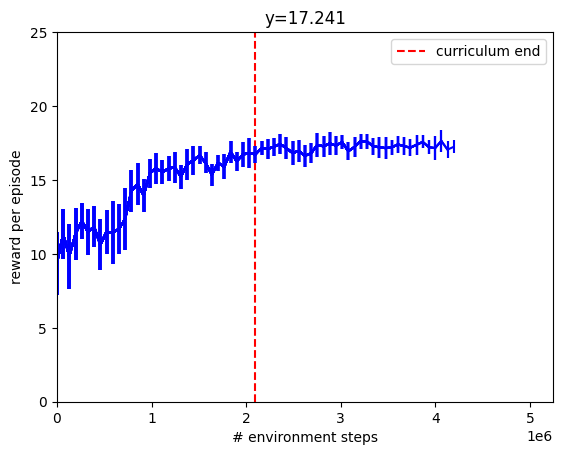

time to jit: 0:02:00.864151
time to train: 0:26:29.495035


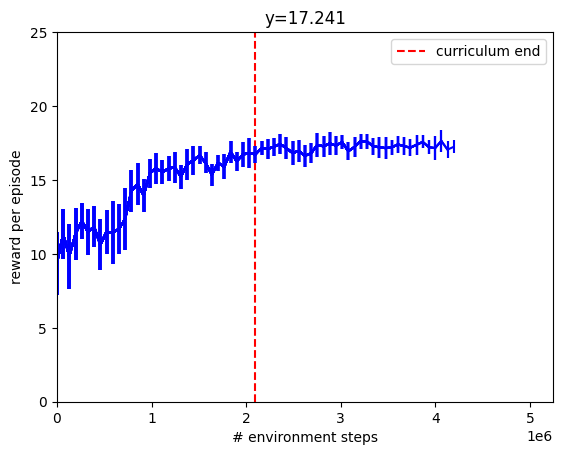

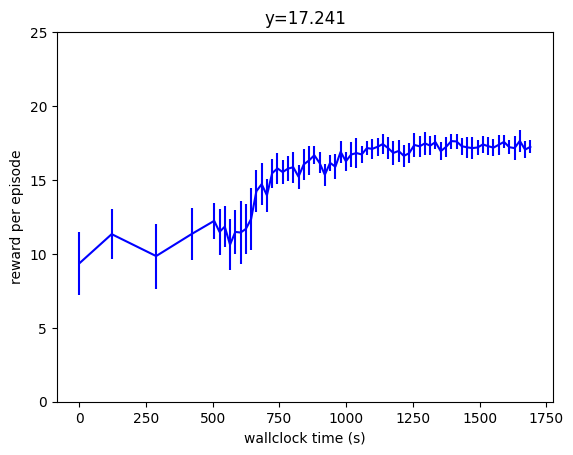

eval/avg_episode_length,▁██▇█▇████▅██▅██▇▇█▆████▆██▆█▇█████▇█▇██
eval/episode_action_rate,█▇██▇▇▇▇▇▇▆▅▅▅▅▄▄▄▅▄▄▃▃▂▂▂▂▂▂▃▂▂▂▁▁▂▂▂▁▁
eval/episode_action_rate_std,▁▃▃▄▆▄▆▅▅▄▇▅▅▇▅▆▆▅▇▅▇▆▆▆▆█▅▇▅▆▅▆▆█▇▆▇▆▅▅
eval/episode_ang_vel_xy,█████▇▇▆▆▅▃▃▂▂▁▂▂▁▂▃▃▃▄▄▄▄▄▄▄▄▄▄▃▃▄▃▃▃▃▂
eval/episode_ang_vel_xy_std,▂▁▂▁▁▁▂▁▂▂▃▄▅▅▆█▅▆▆▆▅▃▄▃▄▄▅▃▃▄▄▃▃▃▃▅▄▄▃▄
eval/episode_assist_beta,▁█▄██▇█▆▇█▇▅██▅██▇▇█████████▆███████▇███
eval/episode_assist_beta_std,▁▁▁▁▃▆▅▁▁▂▁▄█▁▂▁▁▂▂▄▁▅▁▂▆▁▅▄▁▁▂▁▁▁▆▁▁▁▁▁
eval/episode_assist_force_norm,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eval/episode_assist_force_norm_std,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eval/episode_assist_torque_norm,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
+55,...


W&B Run finished.
Saved policy and normalizer params to /data/mujoco_playground/mujoco_playground/experimental/learning/checkpoints/Go2Joystick2-20260414-082323-apg/params.pkl


In [20]:
x_data, y_data, y_dataerr = [], [], []
times = [datetime.now()]
_curriculum_line = None  # Keep reference to the red line

updates_per_epoch = round(apg_params["policy_updates"] / max(apg_params["num_evals"] - 1, 1))
scale_it = updates_per_epoch * apg_params["horizon_length"] * apg_params["num_envs"]

def progress(num_steps, metrics):
  global _curriculum_line
  
  # Log to wandb.
  if USE_WANDB:
    wandb.log(metrics, step=num_steps * scale_it)

  # Plot.
  clear_output(wait=True)
  times.append(datetime.now())
  x_data.append(num_steps * scale_it)
  y_data.append(metrics["eval/iqm_episode_reward"])
  y_dataerr.append(metrics["eval/iqm_episode_reward_std"])

  plt.xlim([0, apg_params.policy_updates * apg_params.horizon_length * apg_params.num_envs * 1.25])
  plt.ylim([0, 25])
  plt.xlabel("# environment steps")
  plt.ylabel("reward per episode")
  plt.title(f"y={y_data[-1]:.3f}")
  plt.errorbar(x_data, y_data, yerr=y_dataerr, color="blue")

  # Add vertical dashed red line at curriculum end step (only once)
  if _curriculum_line is None:
    curriculum_end_step = env_cfg["assistive_wrench"]["curriculum"]["end_step"] * apg_params.num_envs
    _curriculum_line = plt.axvline(x=curriculum_end_step, color="red", linestyle="--", linewidth=1.5, label="curriculum end")
    plt.legend(loc="upper right")
    plt.legend(loc="upper right")
    plt.legend(loc="upper right")

  display(plt.gcf())


def policy_params_fn(current_step, make_policy, params):
  del make_policy  # Unused.
  orbax_checkpointer = ocp.PyTreeCheckpointer()
  save_args = orbax_utils.save_args_from_target(params)
  path = ckpt_path / f"{current_step}"
  orbax_checkpointer.save(path, params, force=True, save_args=save_args)

training_params = dict(apg_params)
del training_params["network_factory"]

train_fn = functools.partial(
  apg.train,
  **training_params,
  network_factory=functools.partial(
      apg_networks.make_apg_networks,
      **apg_params.network_factory
  ),
  restore_checkpoint_path=FINETUNE_PATH,
  progress_fn=progress,
  wrap_env_fn=wrapper.wrap_for_brax_training,
  # policy_params_fn=policy_params_fn,
  randomization_fn=randomizer,
)

env = locomotion.load(env_name, config=env_cfg)
eval_env = locomotion.load(env_name, config=eval_env_cfg)
make_inference_fn, params, _ = train_fn(environment=env, eval_env=eval_env)
if len(times) > 1:
  print(f"time to jit: {times[1] - times[0]}")
  print(f"time to train: {times[-1] - times[1]}")

# Make a final plot of reward and success vs WALLCLOCK time.
plt.figure()
plt.ylim([0, 25])
plt.xlabel("wallclock time (s)")
plt.ylabel("reward per episode")
plt.title(f"y={y_data[-1]:.3f}")
plt.errorbar(
    [(t - times[0]).total_seconds() for t in times[:-1]],
    y_data,
    yerr=y_dataerr,
    color="blue",
)
plt.show()

if USE_WANDB:
    wandb.finish()
    print("W&B Run finished.")

import pickle
# Save normalizer and policy params to the checkpoint dir.
normalizer_params, policy_params = params
with open(ckpt_path / "params.pkl", "wb") as f:
    data = {
      "normalizer_params": normalizer_params,
      "policy_params": policy_params
    }
    pickle.dump(data, f)
    print(f"Saved policy and normalizer params to {ckpt_path / 'params.pkl'}")


## Evaluating

In [21]:
inference_fn = make_inference_fn(params, deterministic=True)
jit_inference_fn = jax.jit(inference_fn)

In [22]:
from mujoco_playground._src.gait import draw_joystick_command

# Enable perturbation in the eval env.
env_cfg = locomotion.get_default_config(env_name)
# env_cfg.episode_length = 500  # Shorten episode length so we don't go out of boudns of the hfield.
env_cfg.disturbance.enable = True
env_cfg.disturbance.velocity_kick = [3.0, 6.0]
env_cfg.disturbance.kick_wait_times = [5.0, 15.0]
# env_cfg.command_config.a = [1.5, 0.8, 2*jp.pi]
env_cfg.assistive_wrench.enable = False  # Disable assistive wrench in eval env to test zero-shot sim-to-real transfer potential.
eval_env = locomotion.load(env_name, config=env_cfg)

jit_reset = jax.jit(eval_env.reset)
jit_step = jax.jit(eval_env.step)

### controller

In [23]:
from mujoco_playground._src.locomotion.go2.Util.TrotUtil import quaternion_to_matrix, rotate_inv

def wrap_to_pi(angle):
  return (angle + jp.pi) % (2 * jp.pi) - jp.pi

def yaw_from_quat(q):
  R = quaternion_to_matrix(q)
  return jp.arctan2(R[1, 0], R[0, 0])

def yaw_pd_controller(data, vx, vy, target_yaw, kp=1.0, kd=0.5, w_clip=0.5):
  q = data.xquat[1]
  yaw = yaw_from_quat(q)
  yaw_err = wrap_to_pi(target_yaw - yaw)

  w_local = rotate_inv(data.cvel[1, :3], q)
  yaw_rate = w_local[2]

  w_cmd = kp * yaw_err - kd * yaw_rate
  w_cmd = jp.clip(w_cmd, -w_clip, w_clip)

  return jp.array([vx, vy, w_cmd])


In [24]:
velocity_kick_range = [0.0, 0.0]  # Disable velocity kick.
kick_duration_range = [0.05, 0.2]


def sample_pert(rng):
  rng, key1, key2 = jax.random.split(rng, 3)
  pert_mag = jax.random.uniform(
      key1, minval=velocity_kick_range[0], maxval=velocity_kick_range[1]
  )
  duration_seconds = jax.random.uniform(
      key2, minval=kick_duration_range[0], maxval=kick_duration_range[1]
  )
  duration_steps = jp.round(duration_seconds / eval_env.dt).astype(jp.int32)
  state.info["pert_mag"] = pert_mag
  state.info["pert_duration"] = duration_steps
  state.info["pert_duration_seconds"] = duration_seconds
  return rng




rng = jax.random.PRNGKey(0)
rollout = []
modify_scene_fns = []

swing_peak = []
rewards = []
linvel = []
angvel = []
track = []
foot_vel = []
rews = []
contact = []

x = 0.5
y = 0.0
target_yaw = 0.0
command = jp.array([x, y, 0.0])

state = jit_reset(rng)
if state.info["steps_since_last_pert"] < state.info["steps_until_next_pert"]:
  rng = sample_pert(rng)
command = yaw_pd_controller(state.data, x, y, target_yaw)
state.info["command"] = command
for i in range(1000):
  if state.info["steps_since_last_pert"] < state.info["steps_until_next_pert"]:
    rng = sample_pert(rng)
  command = yaw_pd_controller(state.data, x, y, target_yaw)
  # print(f"Step {i}: command={command}, pert_mag={state.info['pert_mag']}, pert_duration={state.info['pert_duration_seconds']:.3f}s")
  state.info["command"] = command
  act_rng, rng = jax.random.split(rng)
  ctrl, _ = jit_inference_fn(state.obs, act_rng)
  state = jit_step(state, ctrl)

  reward_tuple = state.info["reward_tuple"]
  rews.append({k: v for k, v in reward_tuple.items()})
  rollout.append(state)
  swing_peak.append(state.info["swing_peak"])
  rewards.append({k: v for k, v in reward_tuple.items()})
  linvel.append(env.get_global_linvel(state.data))
  angvel.append(env.get_gyro(state.data))
  track.append(reward_tuple["tracking_lin_vel"])

  if env._foot_linvel_sensor_adr is not None:
    feet_vel = state.data.sensordata[env._foot_linvel_sensor_adr]
    vel_xy = feet_vel[..., :2]
    vel_norm = jp.linalg.norm(vel_xy, axis=-1)
  else:
    vel_norm = jp.zeros(4)
  foot_vel.append(vel_norm)

  contact.append(state.info["last_contact"])

  xyz = np.array(state.data.xpos[env.base_id])
  xyz += np.array([0, 0, 0.2])
  x_axis = state.data.xmat[env.base_id, 0]
  yaw = -np.arctan2(x_axis[1], x_axis[0])
  foot_xy = np.array(state.info["xy*"])
  print(f"Step {i}: pos={xyz}, yaw={yaw:.2f}, foot_xy={foot_xy}, command={command}")
  modify_scene_fns.append(
      functools.partial(
          draw_command_and_targets,
          cmd=state.info["command"],
          xyz=xyz,
          theta=yaw,
          scl=abs(state.info["command"][0])
          / env_cfg.command_config.a[0],
          foot_xy=foot_xy,
          foot_z=0.02,
      )
  )



Step 0: pos=[0.00282386 0.00433731 0.481676  ], yaw=0.00, foot_xy=[[ 0.19215678  0.142     ]
 [ 0.38821718 -0.14594322]
 [ 0.00493766  0.15614588]
 [-0.19464322 -0.142     ]], command=[ 0.5         0.         -0.12991651]
Step 1: pos=[0.00687352 0.0090806  0.47344098], yaw=0.01, foot_xy=[[ 0.19215678  0.142     ]
 [ 0.38821718 -0.14594322]
 [ 0.00493766  0.15614588]
 [-0.19464322 -0.142     ]], command=[ 0.5         0.         -0.10925401]
Step 2: pos=[0.01207038 0.01373364 0.46582579], yaw=0.00, foot_xy=[[ 0.19215678  0.142     ]
 [ 0.38821718 -0.14594322]
 [ 0.00493766  0.15614588]
 [-0.19464322 -0.142     ]], command=[0.5        0.         0.00585458]
Step 3: pos=[0.01807676 0.01820275 0.45808863], yaw=-0.00, foot_xy=[[ 0.19215678  0.142     ]
 [ 0.38821718 -0.14594322]
 [ 0.00493766  0.15614588]
 [-0.19464322 -0.142     ]], command=[0.5        0.         0.10312128]
Step 4: pos=[0.02441991 0.02214809 0.45132953], yaw=-0.00, foot_xy=[[ 0.19215678  0.142     ]
 [ 0.38821718 -0.145943

In [25]:
render_every = 2
fps = 1.0 / eval_env.dt / render_every
traj = rollout[::render_every]
mod_fns = modify_scene_fns[::render_every]

scene_option = mujoco.MjvOption()
scene_option.geomgroup[2] = True
scene_option.geomgroup[3] = False
scene_option.flags[mujoco.mjtVisFlag.mjVIS_CONTACTPOINT] = True
scene_option.flags[mujoco.mjtVisFlag.mjVIS_TRANSPARENT] = False
scene_option.flags[mujoco.mjtVisFlag.mjVIS_PERTFORCE] = True
# # mjVIS_DECOR is not available in some MuJoCo versions
# if hasattr(mujoco.mjtVisFlag, 'mjVIS_DECOR'):
#   scene_option.flags[mujoco.mjtVisFlag.mjVIS_DECOR] = True
# elif hasattr(mujoco.mjtVisFlag, 'mjVIS_DECORATION'):
#   scene_option.flags[mujoco.mjtVisFlag.mjVIS_DECORATION] = True
if hasattr(mujoco.mjtVisFlag, 'mjVIS_DECOR'):
  scene_option.flags[mujoco.mjtVisFlag.mjVIS_DECOR] = True
elif hasattr(mujoco.mjtVisFlag, 'mjVIS_DECORATION'):
  scene_option.flags[mujoco.mjtVisFlag.mjVIS_DECORATION] = True

frames = eval_env._render_trajectory(
    traj,  # 传入 List[State]
    render_every=1,  # <--- 关键！设为 1，因为 traj 已经是切过的了
    camera="track",
    scene_option=scene_option,  # 传入选项
    modify_scene_fns=mod_fns,   # 传入修改函数
    width=640,
    height=480,
    save_path="./go2_joystick2_apg_eval.mp4",
)

media.show_video(frames, fps=fps, loop=False)

Saving video to ./go2_joystick2_apg_eval.mp4 (FPS=50.0)...


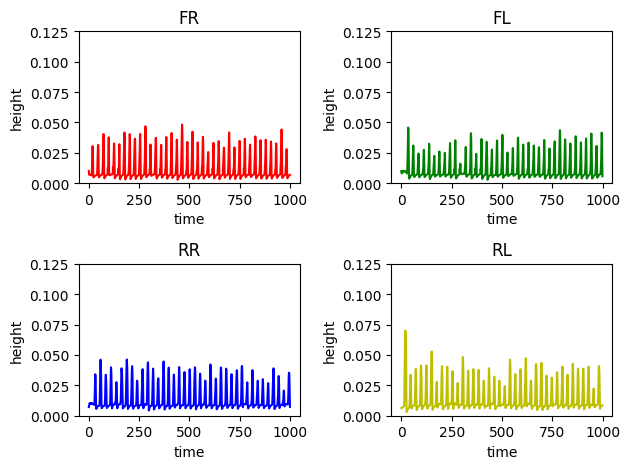

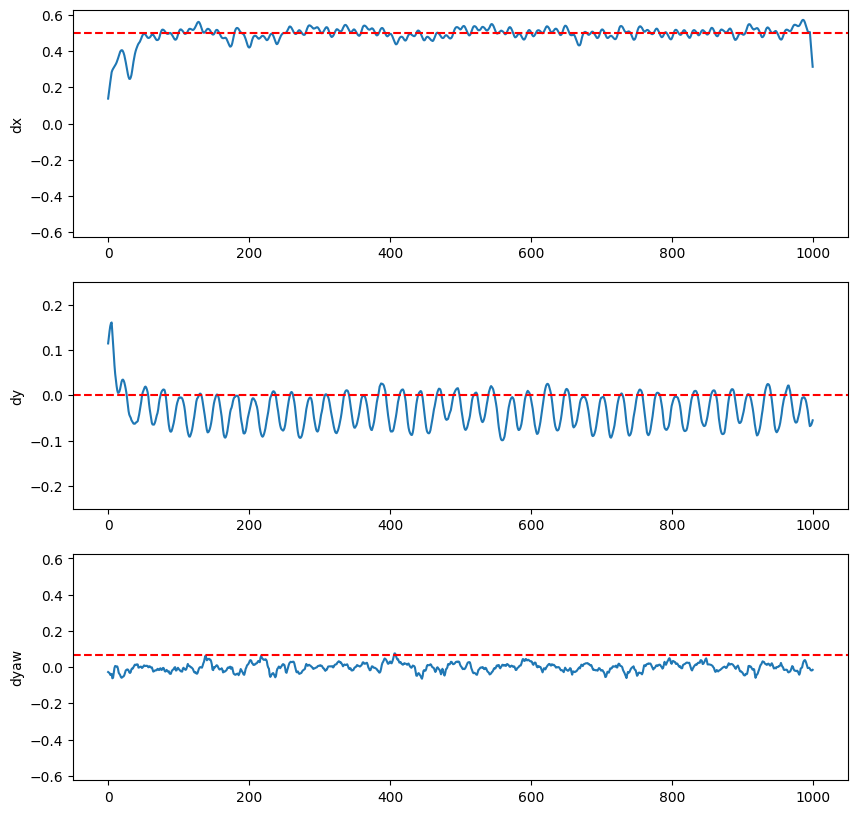

In [26]:
# Plot each foot in a 2x2 grid.
swing_peak = jp.array(swing_peak)
names = ["FR", "FL", "RR", "RL"]
colors = ["r", "g", "b", "y"]
fig, axs = plt.subplots(2, 2)
for i, ax in enumerate(axs.flat):
  ax.plot(swing_peak[:, i], color=colors[i])
  ax.set_ylim([0, 0.1 * 1.25])
  ax.set_title(names[i])
  ax.set_xlabel("time")
  ax.set_ylabel("height")
plt.tight_layout()
plt.show()

linvel_x = jp.array(linvel)[:, 0]
linvel_y = jp.array(linvel)[:, 1]
angvel_yaw = jp.array(angvel)[:, 2]

# Plot whether velocity is within the command range.
linvel_x = jp.convolve(linvel_x, jp.ones(10) / 10, mode="same")
linvel_y = jp.convolve(linvel_y, jp.ones(10) / 10, mode="same")
angvel_yaw = jp.convolve(angvel_yaw, jp.ones(10) / 10, mode="same")

fig, axes = plt.subplots(3, 1, figsize=(10, 10))
axes[0].plot(linvel_x)
axes[1].plot(linvel_y)
axes[2].plot(angvel_yaw)

axes[0].set_ylim(
    -env_cfg.command_config.a[0] * 1.25, env_cfg.command_config.a[0] * 1.25
)
axes[1].set_ylim(
    -env_cfg.command_config.a[1] * 1.25, env_cfg.command_config.a[1] * 1.25
)
axes[2].set_ylim(
    -env_cfg.command_config.a[2] * 1.25, env_cfg.command_config.a[2] * 1.25
)

for i, ax in enumerate(axes):
  ax.axhline(state.info["command"][i], color="red", linestyle="--")

labels = ["dx", "dy", "dyaw"]
for i, ax in enumerate(axes):
  ax.set_ylabel(labels[i])


### Run at increasingly faster speeds

In [27]:
rng = jax.random.PRNGKey(0)
rollout = []
modify_scene_fns = []
swing_peak = []
linvel = []
angvel = []

x = -0.25
command = jp.array([x, 0, 0])
state = jit_reset(rng)
for i in range(1_200):
  # Increase the forward velocity by 0.2 m/s every 400 steps.
  if i % 400 == 0:
    x += 0.25
    print(f"Setting x to {x}")
    # command = jp.array([x, 0, 0])
  command = yaw_pd_controller(state.data, x, 0, 0)
  state.info["command"] = command
  if state.info["steps_since_last_pert"] < state.info["steps_until_next_pert"]:
    rng = sample_pert(rng)
  act_rng, rng = jax.random.split(rng)
  ctrl, _ = jit_inference_fn(state.obs, act_rng)
  state = jit_step(state, ctrl)
  rollout.append(state)
  swing_peak.append(state.info["swing_peak"])
  linvel.append(env.get_global_linvel(state.data))
  angvel.append(env.get_gyro(state.data))
  xyz = np.array(state.data.xpos[env.base_id])
  xyz += np.array([0, 0, 0.2])
  x_axis = state.data.xmat[env.base_id, 0]
  yaw = -np.arctan2(x_axis[1], x_axis[0])
  foot_xy = np.array(state.info["xy*"])
  modify_scene_fns.append(
      functools.partial(
          draw_command_and_targets,
          cmd=command,
          xyz=xyz,
          theta=yaw,
          scl=abs(command[0]) / env_cfg.command_config.a[0],
          foot_xy=foot_xy,
          foot_z=0.02,
      )
  )


Setting x to 0.0
Setting x to 0.25
Setting x to 0.5


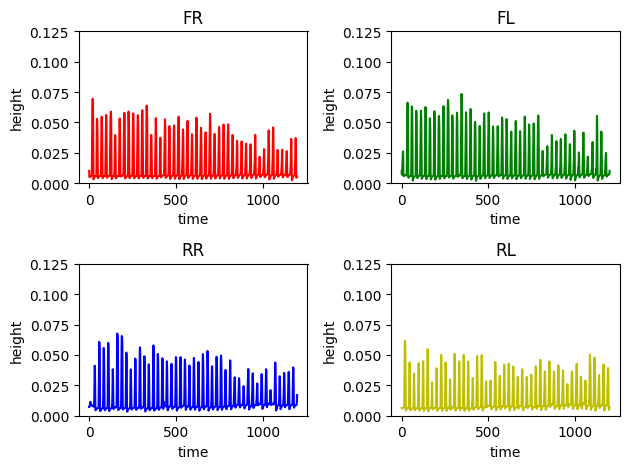

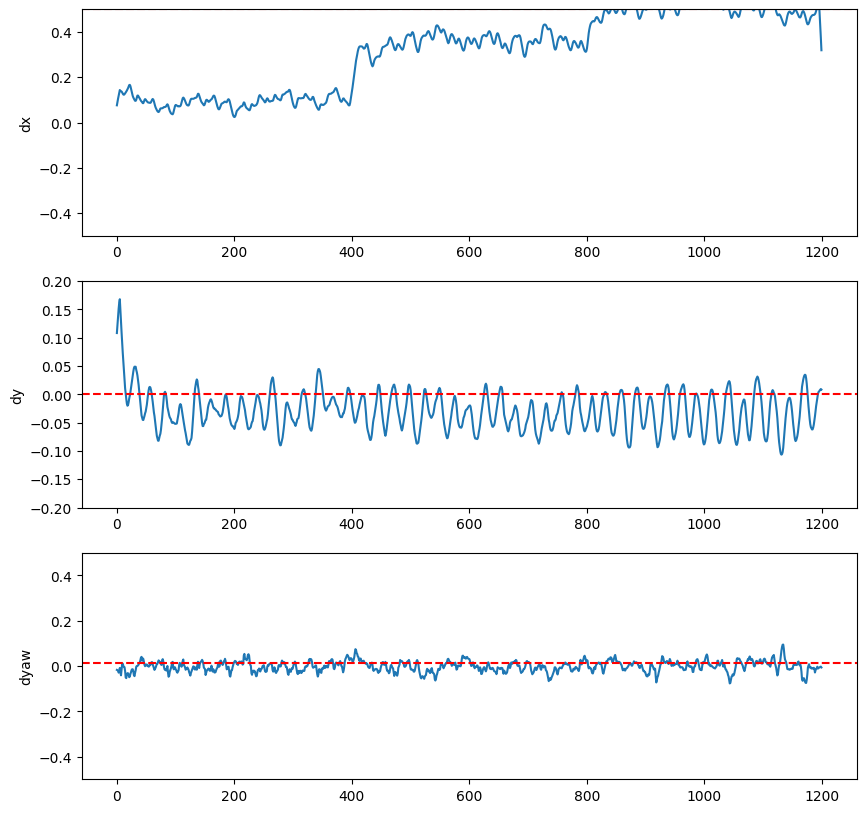

In [28]:
# Plot each foot in a 2x2 grid.
swing_peak = jp.array(swing_peak)
names = ["FR", "FL", "RR", "RL"]
colors = ["r", "g", "b", "y"]
fig, axs = plt.subplots(2, 2)
for i, ax in enumerate(axs.flat):
  ax.plot(swing_peak[:, i], color=colors[i])
  ax.set_ylim([0, 0.1 * 1.25])
  ax.set_title(names[i])
  ax.set_xlabel("time")
  ax.set_ylabel("height")
plt.tight_layout()
plt.show()

linvel_x = jp.array(linvel)[:, 0]
linvel_y = jp.array(linvel)[:, 1]
angvel_yaw = jp.array(angvel)[:, 2]

# Plot whether velocity is within the command range.
linvel_x = jp.convolve(linvel_x, jp.ones(10) / 10, mode="same")
linvel_y = jp.convolve(linvel_y, jp.ones(10) / 10, mode="same")
angvel_yaw = jp.convolve(angvel_yaw, jp.ones(10) / 10, mode="same")

fig, axes = plt.subplots(3, 1, figsize=(10, 10))
axes[0].plot(linvel_x)
axes[1].plot(linvel_y)
axes[2].plot(angvel_yaw)

axes[0].set_ylim(
    -env_cfg.command_config.a[0], env_cfg.command_config.a[0]
)
axes[1].set_ylim(
    -env_cfg.command_config.a[1], env_cfg.command_config.a[1]
)
axes[2].set_ylim(
    -env_cfg.command_config.a[2], env_cfg.command_config.a[2]
)

for i, ax in enumerate(axes):
  ax.axhline(state.info["command"][i], color="red", linestyle="--")

labels = ["dx", "dy", "dyaw"]
for i, ax in enumerate(axes):
  ax.set_ylabel(labels[i])


In [29]:
render_every = 2
fps = 1.0 / eval_env.dt / render_every
print(f"fps: {fps}")

traj = rollout[::render_every]
mod_fns = modify_scene_fns[::render_every]
assert len(traj) == len(mod_fns)

scene_option = mujoco.MjvOption()
scene_option.geomgroup[2] = True
scene_option.geomgroup[3] = False
scene_option.flags[mujoco.mjtVisFlag.mjVIS_CONTACTPOINT] = True
scene_option.flags[mujoco.mjtVisFlag.mjVIS_PERTFORCE] = True
# mjVIS_DECOR is not available in some MuJoCo versions
if hasattr(mujoco.mjtVisFlag, 'mjVIS_DECOR'):
  scene_option.flags[mujoco.mjtVisFlag.mjVIS_DECOR] = True
elif hasattr(mujoco.mjtVisFlag, 'mjVIS_DECORATION'):
  scene_option.flags[mujoco.mjtVisFlag.mjVIS_DECORATION] = True

frames = eval_env.render(
    traj,
    camera="track",
    height=480,
    width=640,
    modify_scene_fns=mod_fns,
    scene_option=scene_option,
)
media.show_video(frames, fps=fps, loop=False)
# media.write_video(f"{env_name}_faster_commands.mp4", frames, fps=fps, qp=18)

fps: 25.0


100%|██████████| 600/600 [00:06<00:00, 99.89it/s] 


### Resist perturbation

In [30]:
rng = jax.random.PRNGKey(67891)
rollout = []
modify_scene_fns = []
n_episodes = 1

x_vel = 0.4
y_vel = 0.0
ang_vel = 0.25
command = jp.array([x_vel, y_vel, ang_vel])

for _ in range(n_episodes):
  state = jit_reset(rng)
  for i in range(1_600):
    if i % 200 == 0:
      x_vel = -x_vel
      y_vel = -y_vel
      ang_vel = -ang_vel
      command = jp.array([x_vel, y_vel, ang_vel])
    state.info["command"] = command
    act_rng, rng = jax.random.split(rng)
    ctrl, _ = jit_inference_fn(state.obs, act_rng)
    state = jit_step(state, ctrl)
    rollout.append(state)
    xyz = np.array(state.data.xpos[env.base_id])
    xyz += np.array([0, 0, 0.2])
    x_axis = state.data.xmat[env.base_id, 0]
    yaw = -np.arctan2(x_axis[1], x_axis[0])
    foot_xy = np.array(state.info["xy*"])
    modify_scene_fns.append(
        functools.partial(
            draw_command_and_targets,
            cmd=command,
            xyz=xyz,
            theta=yaw,
            scl=abs(command[0]) / env_cfg.command_config.a[0],
            foot_xy=foot_xy,
            foot_z=0.02,
        )
    )


In [31]:
render_every = 1
fps = 1.0 / eval_env.dt / render_every
print(f"fps: {fps}")

traj = rollout[::render_every]
mod_fns = modify_scene_fns[::render_every]
assert len(traj) == len(mod_fns)

scene_option = mujoco.MjvOption()
scene_option.geomgroup[2] = True
scene_option.geomgroup[3] = False
scene_option.flags[mujoco.mjtVisFlag.mjVIS_CONTACTPOINT] = True
scene_option.flags[mujoco.mjtVisFlag.mjVIS_PERTFORCE] = True
# mjVIS_DECOR is not available in some MuJoCo versions
if hasattr(mujoco.mjtVisFlag, 'mjVIS_DECOR'):
  scene_option.flags[mujoco.mjtVisFlag.mjVIS_DECOR] = True
elif hasattr(mujoco.mjtVisFlag, 'mjVIS_DECORATION'):
  scene_option.flags[mujoco.mjtVisFlag.mjVIS_DECORATION] = True
## Set to True if you can't see the perturbation force.
scene_option.flags[mujoco.mjtVisFlag.mjVIS_TRANSPARENT] = True

frames = eval_env.render(
    traj,
    camera="track",
    height=480,
    width=640,
    modify_scene_fns=mod_fns,
    scene_option=scene_option,
)
media.show_video(frames, fps=fps, loop=False)
# media.write_video(f"{env_name}_resist_perturbation.mp4", frames, fps=fps, qp=18)

fps: 50.0


100%|██████████| 1600/1600 [00:16<00:00, 94.56it/s]
